# 02 — RSA Model Fitting (PyMC NUTS)


In [1]:
import os
os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pymc as pm
import pytensor.tensor as pt
import arviz as az

from rsa_models import (
    UTTERANCES, STATES, RELATIONS, N_utt, N_sta, N_rel,
    L0, state_vals, U_epi, U_soc_base,
    build_rsa_c, build_rsa_f,
    flat_speaker_logit, load_speaker_counts, load_speaker_logit_avg,
    flat_listener_logit, load_listener_counts, load_listener_logit_avg,
    save_trace, load_trace,
)

print('imports OK')

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


imports OK


In [2]:
# ── CONFIG ────────────────────────────────────────────────────────────────────
LLM_MODELS  = ["qwen3-8b_zero", "llama3-8b_zero"]   # 돌릴 LLM 목록
MCMC_DRAWS  = 4000
MCMC_TUNE   = 4000
MCMC_CHAINS = 4
SKIP_IF_EXISTS = False   # 이미 저장된 trace가 있으면 건너뜀
# ─────────────────────────────────────────────────────────────────────────────

In [3]:
# ── Step 1: Speaker A vs C 디버그 ──────────────────────────────────────────
# 데이터, 모델, trace가 실제로 다른지 확인

for llm in LLM_MODELS:
    print(f'\n{"="*60}')
    print(f'  LLM: {llm}')
    print(f'{"="*60}')

    # ── 데이터 확인 ───────────────────────────────────────────────────────
    flat_sp = flat_speaker_logit(llm)
    counts  = load_speaker_counts(llm)

    print(f'\n[데이터]')
    if flat_sp:
        rel_idx, sta_idx, utt_idx, obs = flat_sp
        print(f'  logit (flat_sp): n={len(obs)}, obs range=[{obs.min():.3f}, {obs.max():.3f}]')
        print(f'  logit unique (rel,sta,utt) combos: {len(set(zip(rel_idx,sta_idx,utt_idx)))}')
    else:
        print('  logit: None')

    if counts is not None:
        print(f'  choice (counts): shape={counts.shape}, total={counts.sum():.0f}')
        print(f'  choice zero cells: {(counts==0).sum()} / {counts.size}')
        print(f'  choice min={counts.min():.0f}, max={counts.max():.0f}')
    else:
        print('  choice: None')

    # ── Trace 확인 ───────────────────────────────────────────────────────
    print(f'\n[Trace posterior means]')
    for mid in ['A', 'B', 'C', 'D']:
        tr = load_trace(llm, 'speaker', mid)
        if tr is None:
            print(f'  Model {mid}: trace 없음'); continue
        pname = 'phi' if mid in ('A','C') else 'alpha'
        try:
            vals = tr.posterior[pname].values.mean(axis=(0,1))
            lam  = float(tr.posterior['lam'].values.mean())
            print(f'  Model {mid} ({pname}): {[round(float(v),3) for v in vals]}  lam={lam:.3f}')
        except Exception as e:
            print(f'  Model {mid}: error — {e}')

    # ── A vs C posterior 직접 비교 ───────────────────────────────────────
    tr_A = load_trace(llm, 'speaker', 'A')
    tr_C = load_trace(llm, 'speaker', 'C')
    if tr_A and tr_C:
        phi_A = tr_A.posterior['phi'].values.flatten()
        phi_C = tr_C.posterior['phi'].values.flatten()
        import numpy as np
        diff = np.abs(phi_A.mean() - phi_C.mean())
        print(f'\n  A.phi mean={phi_A.mean():.4f}  C.phi mean={phi_C.mean():.4f}  |diff|={diff:.4f}')
        if diff < 0.01:
            print('  ⚠️  A와 C posterior가 사실상 동일 — trace 파일 동일하거나 data bug')
            # 파일 크기 비교
            from pathlib import Path
            pa = Path(f'results/traces/{llm}/speaker_A.nc')
            pc = Path(f'results/traces/{llm}/speaker_C.nc')
            print(f'  파일 크기: A={pa.stat().st_size if pa.exists() else "없음"}  C={pc.stat().st_size if pc.exists() else "없음"}')
        else:
            print('  ✓ A와 C posterior 다름 — 정상')



  LLM: qwen3-8b_zero
flat_speaker_logit_qwen3-8b_zero: 500 obs (5 per condition)
[수동검토본 사용] results/to_review/speaker_choice_qwen3-8b_zero.csv
파싱 실패: 0/5000 (0.0%)
speaker_counts_qwen3-8b_zero: (4, 5, 5), total=5000

[데이터]
  logit (flat_sp): n=500, obs range=[-22.982, -0.000]
  logit unique (rel,sta,utt) combos: 100
  choice (counts): shape=(4, 5, 5), total=5000
  choice zero cells: 69 / 100
  choice min=0, max=250

[Trace posterior means]
  Model A (phi): [0.543, 0.557, 0.688, 0.701]  lam=4.258
  Model B (alpha): [3.701, 3.662, 2.582, 0.986]  lam=2.789
  Model C (phi): [0.84, 0.827, 0.873, 0.853]  lam=4.078
  Model D (alpha): [2.562, 2.638, 2.121, 1.994]  lam=3.473

  A.phi mean=0.6222  C.phi mean=0.8481  |diff|=0.2260
  ✓ A와 C posterior 다름 — 정상

  LLM: llama3-8b_zero
flat_speaker_logit_llama3-8b_zero: 500 obs (5 per condition)
[수동검토본 사용] results/to_review/speaker_choice_llama3-8b_zero.csv
파싱 실패: 0/5000 (0.0%)
speaker_counts_llama3-8b_zero: (4, 5, 5), total=5000

[데이터]
  logit (flat_

---
## Speaker Models (A – D)

In [4]:
def fit_speaker(llm_model):
    flat_sp        = flat_speaker_logit(llm_model)
    counts_speaker = load_speaker_counts(llm_model)

    # ── Model A: Choice × pRRSAc ──────────────────────────────────────────────
    if SKIP_IF_EXISTS and load_trace(llm_model, 'speaker', 'A') is not None:
        print('  [skip] speaker A — already exists')
    elif counts_speaker is None:
        print('  [skip] speaker A — no choice data')
    else:
        n_sp = counts_speaker.sum(axis=-1)
        with pm.Model() as m:
            phi   = pm.Uniform('phi',   lower=0, upper=1, shape=N_rel)
            alpha = pm.Uniform('alpha', lower=0, upper=5)
            lam   = pm.Uniform('lam',   lower=0, upper=20)
            log_S1, _ = build_rsa_c(phi, alpha, lam)
            P_S1 = pt.exp(log_S1).transpose(0, 2, 1)
            pm.Multinomial('obs', n=n_sp, p=P_S1, observed=counts_speaker)
        with m:
            tr = pm.sample(MCMC_DRAWS, tune=MCMC_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.95, return_inferencedata=True)
        save_trace(tr, llm_model, 'speaker', 'A')

    # ── Model B: Choice × pRRSAf ──────────────────────────────────────────────
    if SKIP_IF_EXISTS and load_trace(llm_model, 'speaker', 'B') is not None:
        print('  [skip] speaker B — already exists')
    elif counts_speaker is None:
        print('  [skip] speaker B — no choice data')
    else:
        n_sp = counts_speaker.sum(axis=-1)
        with pm.Model() as m:
            alpha = pm.Uniform('alpha', lower=0, upper=5, shape=N_rel)
            phi   = pm.Uniform('phi',   lower=0, upper=1)
            lam   = pm.Uniform('lam',   lower=0, upper=20)
            log_S1, _ = build_rsa_f(alpha, phi, lam)
            P_S1 = pt.exp(log_S1).transpose(0, 2, 1)
            pm.Multinomial('obs', n=n_sp, p=P_S1, observed=counts_speaker)
        with m:
            tr = pm.sample(MCMC_DRAWS, tune=MCMC_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.95, return_inferencedata=True)
        save_trace(tr, llm_model, 'speaker', 'B')

    # ── Model C: Logit × pRRSAc ───────────────────────────────────────────────
    if SKIP_IF_EXISTS and load_trace(llm_model, 'speaker', 'C') is not None:
        print('  [skip] speaker C — already exists')
    elif flat_sp is None:
        print('  [skip] speaker C — no logit data')
    else:
        rel_idx, sta_idx, utt_idx, obs = flat_sp
        with pm.Model() as m:
            phi   = pm.Uniform('phi',   lower=0, upper=1, shape=N_rel)
            alpha = pm.Uniform('alpha', lower=0, upper=5)
            lam   = pm.Uniform('lam',   lower=0, upper=20)
            c     = pm.Normal('c',      mu=0,    sigma=3)
            sigma = pm.HalfNormal('sigma', sigma=1)
            log_S1, _ = build_rsa_c(phi, alpha, lam)
            pm.Normal('obs', mu=log_S1[rel_idx, utt_idx, sta_idx] + c,
                      sigma=sigma, observed=obs)
        with m:
            tr = pm.sample(MCMC_DRAWS, tune=MCMC_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.95, return_inferencedata=True)
        save_trace(tr, llm_model, 'speaker', 'C')

    # ── Model D: Logit × pRRSAf ───────────────────────────────────────────────
    if SKIP_IF_EXISTS and load_trace(llm_model, 'speaker', 'D') is not None:
        print('  [skip] speaker D — already exists')
    elif flat_sp is None:
        print('  [skip] speaker D — no logit data')
    else:
        rel_idx, sta_idx, utt_idx, obs = flat_sp
        with pm.Model() as m:
            alpha = pm.Uniform('alpha', lower=0, upper=5, shape=N_rel)
            phi   = pm.Uniform('phi',   lower=0, upper=1)
            lam   = pm.Uniform('lam',   lower=0, upper=20)
            c     = pm.Normal('c',      mu=0,    sigma=3)
            sigma = pm.HalfNormal('sigma', sigma=1)
            log_S1, _ = build_rsa_f(alpha, phi, lam)
            pm.Normal('obs', mu=log_S1[rel_idx, utt_idx, sta_idx] + c,
                      sigma=sigma, observed=obs)
        with m:
            tr = pm.sample(MCMC_DRAWS, tune=MCMC_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.95, return_inferencedata=True)
        save_trace(tr, llm_model, 'speaker', 'D')


for llm in LLM_MODELS:
    print(f'\n=== Speaker: {llm} ===')
    fit_speaker(llm)


=== Speaker: qwen3-8b_zero ===
flat_speaker_logit_qwen3-8b_zero: 500 obs (5 per condition)
[수동검토본 사용] results/to_review/speaker_choice_qwen3-8b_zero.csv
파싱 실패: 0/5000 (0.0%)
speaker_counts_qwen3-8b_zero: (4, 5, 5), total=5000


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 30 seconds.


saved → results/traces/qwen3-8b_zero/speaker_A.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 25 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.


saved → results/traces/qwen3-8b_zero/speaker_B.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 40 seconds.


saved → results/traces/qwen3-8b_zero/speaker_C.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 19 seconds.


saved → results/traces/qwen3-8b_zero/speaker_D.nc

=== Speaker: llama3-8b_zero ===
flat_speaker_logit_llama3-8b_zero: 500 obs (5 per condition)
[수동검토본 사용] results/to_review/speaker_choice_llama3-8b_zero.csv
파싱 실패: 0/5000 (0.0%)
speaker_counts_llama3-8b_zero: (4, 5, 5), total=5000


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 17 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.


saved → results/traces/llama3-8b_zero/speaker_A.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 32 seconds.
There were 5 divergences after tuning. Increase `target_accept` or reparameterize.


saved → results/traces/llama3-8b_zero/speaker_B.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 40 seconds.


saved → results/traces/llama3-8b_zero/speaker_C.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 21 seconds.


saved → results/traces/llama3-8b_zero/speaker_D.nc


---
## Listener Models (A – D)

In [5]:
def fit_listener(llm_model):
    flat_li         = flat_listener_logit(llm_model)
    counts_listener = load_listener_counts(llm_model)

    # ── Model A: Choice × pRRSAc ──────────────────────────────────────────────
    if SKIP_IF_EXISTS and load_trace(llm_model, 'listener', 'A') is not None:
        print('  [skip] listener A — already exists')
    elif counts_listener is None:
        print('  [skip] listener A — no choice data')
    else:
        n_li = counts_listener.sum(axis=-1)
        with pm.Model() as m:
            phi   = pm.Uniform('phi',   lower=0, upper=1, shape=N_rel)
            alpha = pm.Uniform('alpha', lower=0, upper=5)
            lam   = pm.Uniform('lam',   lower=0, upper=20)
            _, log_L1 = build_rsa_c(phi, alpha, lam)
            pm.Multinomial('obs', n=n_li, p=pt.exp(log_L1), observed=counts_listener)
        with m:
            tr = pm.sample(MCMC_DRAWS, tune=MCMC_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.99, return_inferencedata=True)
        save_trace(tr, llm_model, 'listener', 'A')

    # ── Model B: Choice × pRRSAf ──────────────────────────────────────────────
    if SKIP_IF_EXISTS and load_trace(llm_model, 'listener', 'B') is not None:
        print('  [skip] listener B — already exists')
    elif counts_listener is None:
        print('  [skip] listener B — no choice data')
    else:
        n_li = counts_listener.sum(axis=-1)
        with pm.Model() as m:
            alpha = pm.Uniform('alpha', lower=0, upper=5, shape=N_rel)
            phi   = pm.Uniform('phi',   lower=0, upper=1)
            lam   = pm.Uniform('lam',   lower=0, upper=20)
            _, log_L1 = build_rsa_f(alpha, phi, lam)
            pm.Multinomial('obs', n=n_li, p=pt.exp(log_L1), observed=counts_listener)
        with m:
            tr = pm.sample(MCMC_DRAWS, tune=MCMC_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.95, return_inferencedata=True)
        save_trace(tr, llm_model, 'listener', 'B')

    # ── Model C: Logit × pRRSAc ───────────────────────────────────────────────
    if SKIP_IF_EXISTS and load_trace(llm_model, 'listener', 'C') is not None:
        print('  [skip] listener C — already exists')
    elif flat_li is None:
        print('  [skip] listener C — no logit data')
    else:
        rel_idx, utt_idx, sta_idx, obs = flat_li
        with pm.Model() as m:
            phi   = pm.Uniform('phi',   lower=0, upper=1, shape=N_rel)
            alpha = pm.Uniform('alpha', lower=0, upper=5)
            lam   = pm.Uniform('lam',   lower=0, upper=20)
            c     = pm.Normal('c',      mu=0,    sigma=3)
            sigma = pm.HalfNormal('sigma', sigma=1)
            _, log_L1 = build_rsa_c(phi, alpha, lam)
            pm.Normal('obs', mu=log_L1[rel_idx, utt_idx, sta_idx] + c,
                      sigma=sigma, observed=obs)
        with m:
            tr = pm.sample(MCMC_DRAWS, tune=MCMC_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.95, return_inferencedata=True)
        save_trace(tr, llm_model, 'listener', 'C')

    # ── Model D: Logit × pRRSAf ───────────────────────────────────────────────
    if SKIP_IF_EXISTS and load_trace(llm_model, 'listener', 'D') is not None:
        print('  [skip] listener D — already exists')
    elif flat_li is None:
        print('  [skip] listener D — no logit data')
    else:
        rel_idx, utt_idx, sta_idx, obs = flat_li
        with pm.Model() as m:
            alpha = pm.Uniform('alpha', lower=0, upper=5, shape=N_rel)
            phi   = pm.Uniform('phi',   lower=0, upper=1)
            lam   = pm.Uniform('lam',   lower=0, upper=20)
            c     = pm.Normal('c',      mu=0,    sigma=3)
            sigma = pm.HalfNormal('sigma', sigma=1)
            _, log_L1 = build_rsa_f(alpha, phi, lam)
            pm.Normal('obs', mu=log_L1[rel_idx, utt_idx, sta_idx] + c,
                      sigma=sigma, observed=obs)
        with m:
            tr = pm.sample(MCMC_DRAWS, tune=MCMC_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.95, return_inferencedata=True)
        save_trace(tr, llm_model, 'listener', 'D')


for llm in LLM_MODELS:
    print(f'\n=== Listener: {llm} ===')
    fit_listener(llm)


=== Listener: qwen3-8b_zero ===
flat_listener_logit_qwen3-8b_zero: 500 obs (5 per condition)
[수동검토본 사용] results/to_review/listener_choice_qwen3-8b_zero.csv
파싱 실패: 0/5000 (0.0%)
listener_counts_qwen3-8b_zero: (4, 5, 5), total=5000


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 69 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


saved → results/traces/qwen3-8b_zero/listener_A.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 84 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


saved → results/traces/qwen3-8b_zero/listener_B.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 56 seconds.


saved → results/traces/qwen3-8b_zero/listener_C.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 133 seconds.


saved → results/traces/qwen3-8b_zero/listener_D.nc

=== Listener: llama3-8b_zero ===
flat_listener_logit_llama3-8b_zero: 500 obs (5 per condition)
[수동검토본 사용] results/to_review/listener_choice_llama3-8b_zero.csv
파싱 실패: 50/5000 (1.0%)
listener_counts_llama3-8b_zero: (4, 5, 5), total=4950


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 66 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


saved → results/traces/llama3-8b_zero/listener_A.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 129 seconds.


saved → results/traces/llama3-8b_zero/listener_B.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 52 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.


saved → results/traces/llama3-8b_zero/listener_C.nc


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 26 seconds.


saved → results/traces/llama3-8b_zero/listener_D.nc


---
## Results — Convergence & Parameter Summary
PyMC로 NUTS 샘플러를 돌리면 4개의 체인이 각각 독립적으로 파라미터 공간을 탐색하면서 샘플을 뽑는다. 예를 들어 phi의 posterior distribution을 추정하기 위해 4chains x 2000 draws 총 8000개의 샘플이 생성된다. 이때 각 체인이 수렴(convergence)했는지 확인하기 위해 R-hat (Gelman-Rubin statistic)을 계산한다. R-hat 값이 1에 가까울수록 수렴이 잘 된 것이고, 1.05 이상이면 수렴하지 않은 것으로 간주한다. R-hat이 높은 모델은 파라미터 추정값 자체가 불안정하다는 뜻이라 모델의 파이와 알파 값을 논문에서 해석할 때 주의해야한다. 단순히 잘 수렴 안했다가 아니라 이 조건에서 rsa모델 자체가 데이터를 잘 설명 못하고 있을 수도 있다 


In [6]:
# ── 수렴 진단 ─────────────────────────────────────────────────────────────────
PRIMARY_PARAM = {
    ('speaker',  'A'): 'phi',
    ('speaker',  'B'): 'alpha',
    ('speaker',  'C'): 'phi',
    ('speaker',  'D'): 'alpha',
    ('listener', 'A'): 'phi',
    ('listener', 'B'): 'alpha',
    ('listener', 'C'): 'phi',
    ('listener', 'D'): 'alpha',
}

rows = []
for llm in LLM_MODELS:
    for role in ['speaker', 'listener']:
        for mid in ['A', 'B', 'C', 'D']:
            tr = load_trace(llm, role, mid)
            if tr is None:
                rows.append({'LLM': llm, 'Role': role, 'Model': mid,
                             'max_rhat': float('nan'), 'status': '?'})
                continue
            pname = PRIMARY_PARAM[(role, mid)]
            rhat_vals = [float(az.rhat(tr)[v].values.max())
                         for v in [pname, 'lam'] if v in tr.posterior]
            max_r = max(rhat_vals)
            status = '✓' if max_r < 1.01 else '△' if max_r < 1.05 else '✗'
            rows.append({'LLM': llm, 'Role': role, 'Model': mid,
                         'max_rhat': round(max_r, 4), 'status': status})

df_conv = pd.DataFrame(rows)
print(df_conv.to_string(index=False))

df_conv.to_csv('results/convergence_diagnostics.csv', index=False)
print('\n저장 → results/convergence_diagnostics.csv')

           LLM     Role Model  max_rhat status
 qwen3-8b_zero  speaker     A    1.0044      ✓
 qwen3-8b_zero  speaker     B    1.0038      ✓
 qwen3-8b_zero  speaker     C    1.0034      ✓
 qwen3-8b_zero  speaker     D    1.0007      ✓
 qwen3-8b_zero listener     A    1.7371      ✗
 qwen3-8b_zero listener     B    1.5282      ✗
 qwen3-8b_zero listener     C    1.0012      ✓
 qwen3-8b_zero listener     D    1.0007      ✓
llama3-8b_zero  speaker     A    1.0018      ✓
llama3-8b_zero  speaker     B    1.0012      ✓
llama3-8b_zero  speaker     C    1.0017      ✓
llama3-8b_zero  speaker     D    1.0020      ✓
llama3-8b_zero listener     A    1.5338      ✗
llama3-8b_zero listener     B    1.0012      ✓
llama3-8b_zero listener     C    1.0033      ✓
llama3-8b_zero listener     D    1.0007      ✓

저장 → results/convergence_diagnostics.csv


In [7]:
# ── 수렴 진단 Test 1: Multi-seed (전체 모델) ─────────────────────────────────
# 목적: 수렴 실패가 seed에 무관하게 일관적인지 확인
# 기대: 모든 seed에서 R̂ > 1.05 → structural convergence failure 확정

SEEDS = [42, 123, 456, 789, 1234, 5678, 9999, 11, 222, 3333]
ROLES_MODELS = [
    ('speaker',  'A', build_rsa_c, 'phi',   'choice_speaker'),
    ('speaker',  'B', build_rsa_f, 'alpha', 'choice_speaker'),
    ('speaker',  'C', build_rsa_c, 'phi',   'flat_speaker'),
    ('speaker',  'D', build_rsa_f, 'alpha', 'flat_speaker'),
    ('listener', 'A', build_rsa_c, 'phi',   'choice_listener'),
    ('listener', 'B', build_rsa_f, 'alpha', 'choice_listener'),
    ('listener', 'C', build_rsa_c, 'phi',   'flat_listener'),
    ('listener', 'D', build_rsa_f, 'alpha', 'flat_listener'),
]

seed_results = []

for llm in LLM_MODELS:
    for role, mid, build_fn, pname, data_type in ROLES_MODELS:
        print(f'\n--- {llm} | {role} {mid} ---')

        if data_type == 'flat_speaker':
            data = flat_speaker_logit(llm)
            if data is None: print('  [skip] no data'); continue
            rel_idx, sta_idx, utt_idx, obs = data
        elif data_type == 'flat_listener':
            data = flat_listener_logit(llm)
            if data is None: print('  [skip] no data'); continue
            rel_idx, utt_idx, sta_idx, obs = data
        elif data_type == 'choice_speaker':
            counts = load_speaker_counts(llm)
            if counts is None: print('  [skip] no data'); continue
        else:  # choice_listener
            counts = load_listener_counts(llm)
            if counts is None: print('  [skip] no data'); continue

        for seed in SEEDS:
            with pm.Model() as m:
                if pname == 'phi':
                    phi   = pm.Uniform('phi',   lower=0, upper=1, shape=N_rel)
                    alpha = pm.Uniform('alpha', lower=0, upper=5)
                else:
                    alpha = pm.Uniform('alpha', lower=0, upper=5, shape=N_rel)
                    phi   = pm.Uniform('phi',   lower=0, upper=1)
                lam = pm.Uniform('lam', lower=0, upper=20)

                _, log_L1 = build_fn(phi, alpha, lam) if pname == 'phi' else build_rsa_f(alpha, phi, lam)

                if data_type in ('flat_speaker', 'flat_listener'):
                    c_ = pm.Normal('c', mu=0, sigma=3)
                    sigma = pm.HalfNormal('sigma', sigma=1)
                    pm.Normal('obs', mu=log_L1[rel_idx, utt_idx, sta_idx] + c_, sigma=sigma, observed=obs)
                elif data_type == 'choice_speaker':
                    n_obs  = counts.sum(axis=-1).astype(int)
                    log_S1 = log_L1  # build_rsa_c/f 첫 번째 반환값이 log_S1
                    P_S1   = pt.exp(log_S1).transpose(0, 2, 1)  # (N_rel, N_sta, N_utt)
                    pm.Multinomial('obs', n=n_obs, p=P_S1, observed=counts.astype(int))
                else:  # choice_listener
                    n_obs  = counts.sum(axis=-1).astype(int)
                    p_raw  = pt.clip(pt.exp(log_L1), 1e-6, 1.0)
                    p_safe = p_raw / p_raw.sum(axis=-1, keepdims=True)
                    pm.Multinomial('obs', n=n_obs, p=p_safe, observed=counts.astype(int))

            with m:
                tr = pm.sample(1000, tune=1000, chains=2, random_seed=seed,
                               target_accept=0.95, return_inferencedata=True,
                               progressbar=False)

            rhat_vals = [float(az.rhat(tr)[v].values.max())
                         for v in [pname, 'lam'] if v in tr.posterior]
            max_r = max(rhat_vals)
            status = '✓' if max_r < 1.01 else '△' if max_r < 1.05 else '✗'
            print(f'  seed={seed}: max R̂={max_r:.4f}  {status}')
            seed_results.append({'llm': llm, 'role': role, 'model': mid,
                                 'seed': seed, 'max_rhat': round(max_r, 4), 'status': status})

import pandas as pd
df_seed = pd.DataFrame(seed_results)
df_seed.to_csv('results/convergence_seed_test.csv', index=False)
print('\n저장 → results/convergence_seed_test.csv')
print(df_seed.pivot_table(index=['llm','role','model'], columns='seed',
                          values='max_rhat', aggfunc='first').to_string())



--- qwen3-8b_zero | speaker A ---
[수동검토본 사용] results/to_review/speaker_choice_qwen3-8b_zero.csv
파싱 실패: 0/5000 (0.0%)
speaker_counts_qwen3-8b_zero: (4, 5, 5), total=5000


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...


SamplingError: Initial evaluation of model at starting point failed!
Starting values:
{'phi_interval__': array([ 0.53996424, -0.45375022,  0.67958717, -0.31606359]), 'alpha_interval__': array(0.78895552), 'lam_interval__': array(-0.0120365)}

Logp initial evaluation results:
{'phi': -5.81, 'alpha': -1.54, 'lam': -1.39, 'obs': -inf}
You can call `model.debug()` for more details.

In [7]:
# ── 수렴 진단 Test 2: Longer Chain (전체 모델) ──────────────────────────────
# 목적: draws=10000, tune=5000으로 수렴 가능한지 확인
# 시간 오래 걸림 — 필요한 경우에만 실행

LONG_DRAWS = 10000
LONG_TUNE  = 5000

long_results = []

for llm in LLM_MODELS:
    for role, mid, build_fn, pname, data_type in ROLES_MODELS:
        print(f'\n--- {llm} | {role} {mid} (long chain) ---')

        if data_type == 'flat_speaker':
            data = flat_speaker_logit(llm)
            if data is None: continue
            rel_idx, sta_idx, utt_idx, obs = data
        elif data_type == 'flat_listener':
            data = flat_listener_logit(llm)
            if data is None: continue
            rel_idx, utt_idx, sta_idx, obs = data
        elif data_type == 'choice_speaker':
            counts = load_speaker_counts(llm)
            if counts is None: continue
        else:  # choice_listener
            counts = load_listener_counts(llm)
            if counts is None: continue

        with pm.Model() as m:
            if pname == 'phi':
                phi   = pm.Uniform('phi',   lower=0, upper=1, shape=N_rel)
                alpha = pm.Uniform('alpha', lower=0, upper=5)
            else:
                alpha = pm.Uniform('alpha', lower=0, upper=5, shape=N_rel)
                phi   = pm.Uniform('phi',   lower=0, upper=1)
            lam = pm.Uniform('lam', lower=0, upper=20)
            _, log_L1 = build_fn(phi, alpha, lam) if pname == 'phi' else build_rsa_f(alpha, phi, lam)

            if data_type in ('flat_speaker', 'flat_listener'):
                c_ = pm.Normal('c', mu=0, sigma=3)
                sigma = pm.HalfNormal('sigma', sigma=1)
                pm.Normal('obs', mu=log_L1[rel_idx, utt_idx, sta_idx] + c_, sigma=sigma, observed=obs)
            elif data_type == 'choice_speaker':
                n_obs  = counts.sum(axis=-1).astype(int)
                P_S1   = pt.exp(log_L1).transpose(0, 2, 1)
                pm.Multinomial('obs', n=n_obs, p=P_S1, observed=counts.astype(int))
            else:  # choice_listener
                n_obs  = counts.sum(axis=-1).astype(int)
                p_raw  = pt.clip(pt.exp(log_L1), 1e-6, 1.0)
                p_safe = p_raw / p_raw.sum(axis=-1, keepdims=True)
                pm.Multinomial('obs', n=n_obs, p=p_safe, observed=counts.astype(int))

        with m:
            tr = pm.sample(LONG_DRAWS, tune=LONG_TUNE, chains=MCMC_CHAINS,
                           target_accept=0.95, return_inferencedata=True)

        rhat_vals = [float(az.rhat(tr)[v].values.max())
                     for v in [pname, 'lam'] if v in tr.posterior]
        max_r = max(rhat_vals)
        status = '✓' if max_r < 1.01 else '△' if max_r < 1.05 else '✗'
        print(f'  max R̂={max_r:.4f}  {status}')
        long_results.append({'llm': llm, 'role': role, 'model': mid,
                              'max_rhat': round(max_r, 4), 'status': status})

import pandas as pd
df_long = pd.DataFrame(long_results)
df_long.to_csv('results/convergence_long_chain.csv', index=False)
print('\n저장 → results/convergence_long_chain.csv')
print(df_long.to_string(index=False))



--- qwen3-8b_zero | speaker A (long chain) ---
flat_speaker_logit_qwen3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 108 seconds.


  max R̂=1.0015  ✓

--- qwen3-8b_zero | speaker B (long chain) ---
flat_speaker_logit_qwen3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 57 seconds.


  max R̂=1.0002  ✓

--- qwen3-8b_zero | speaker C (long chain) ---
flat_speaker_logit_qwen3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 111 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.


  max R̂=1.0007  ✓

--- qwen3-8b_zero | speaker D (long chain) ---
flat_speaker_logit_qwen3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 74 seconds.


  max R̂=1.0002  ✓

--- qwen3-8b_zero | listener A (long chain) ---
[수동검토본 사용] results/to_review/listener_choice_qwen3-8b_zero.csv
파싱 실패: 0/3000 (0.0%)
listener_counts_qwen3-8b_zero: (4, 5, 5), total=3000


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 108 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  max R̂=1.5223  ✗

--- qwen3-8b_zero | listener B (long chain) ---
[수동검토본 사용] results/to_review/listener_choice_qwen3-8b_zero.csv
파싱 실패: 0/3000 (0.0%)
listener_counts_qwen3-8b_zero: (4, 5, 5), total=3000


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 248 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  max R̂=1.5286  ✗

--- qwen3-8b_zero | listener C (long chain) ---
flat_listener_logit_qwen3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 169 seconds.


  max R̂=1.0005  ✓

--- qwen3-8b_zero | listener D (long chain) ---
flat_listener_logit_qwen3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 363 seconds.


  max R̂=1.0002  ✓

--- llama3-8b_zero | speaker A (long chain) ---
flat_speaker_logit_llama3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 147 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  max R̂=1.6899  ✗

--- llama3-8b_zero | speaker B (long chain) ---
flat_speaker_logit_llama3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 218 seconds.
There were 48 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  max R̂=1.1256  ✗

--- llama3-8b_zero | speaker C (long chain) ---
flat_speaker_logit_llama3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 198 seconds.
There were 8 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  max R̂=1.6808  ✗

--- llama3-8b_zero | speaker D (long chain) ---
flat_speaker_logit_llama3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 231 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  max R̂=1.0120  △

--- llama3-8b_zero | listener A (long chain) ---
[수동검토본 사용] results/to_review/listener_choice_llama3-8b_zero.csv
파싱 실패: 14/3000 (0.5%)
listener_counts_llama3-8b_zero: (4, 5, 5), total=2986


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 101 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  max R̂=1.5281  ✗

--- llama3-8b_zero | listener B (long chain) ---
[수동검토본 사용] results/to_review/listener_choice_llama3-8b_zero.csv
파싱 실패: 14/3000 (0.5%)
listener_counts_llama3-8b_zero: (4, 5, 5), total=2986


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 248 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


  max R̂=1.5277  ✗

--- llama3-8b_zero | listener C (long chain) ---
flat_listener_logit_llama3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [phi, alpha, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 142 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.


  max R̂=1.0008  ✓

--- llama3-8b_zero | listener D (long chain) ---
flat_listener_logit_llama3-8b_zero: 500 obs (5 per condition)


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, phi, lam, c, sigma]


Sampling 4 chains for 5_000 tune and 10_000 draw iterations (20_000 + 40_000 draws total) took 59 seconds.


  max R̂=1.0005  ✓

저장 → results/convergence_long_chain.csv
           llm     role model  max_rhat status
 qwen3-8b_zero  speaker     A    1.0015      ✓
 qwen3-8b_zero  speaker     B    1.0002      ✓
 qwen3-8b_zero  speaker     C    1.0007      ✓
 qwen3-8b_zero  speaker     D    1.0002      ✓
 qwen3-8b_zero listener     A    1.5223      ✗
 qwen3-8b_zero listener     B    1.5286      ✗
 qwen3-8b_zero listener     C    1.0005      ✓
 qwen3-8b_zero listener     D    1.0002      ✓
llama3-8b_zero  speaker     A    1.6899      ✗
llama3-8b_zero  speaker     B    1.1256      ✗
llama3-8b_zero  speaker     C    1.6808      ✗
llama3-8b_zero  speaker     D    1.0120      △
llama3-8b_zero listener     A    1.5281      ✗
llama3-8b_zero listener     B    1.5277      ✗
llama3-8b_zero listener     C    1.0008      ✓
llama3-8b_zero listener     D    1.0005      ✓


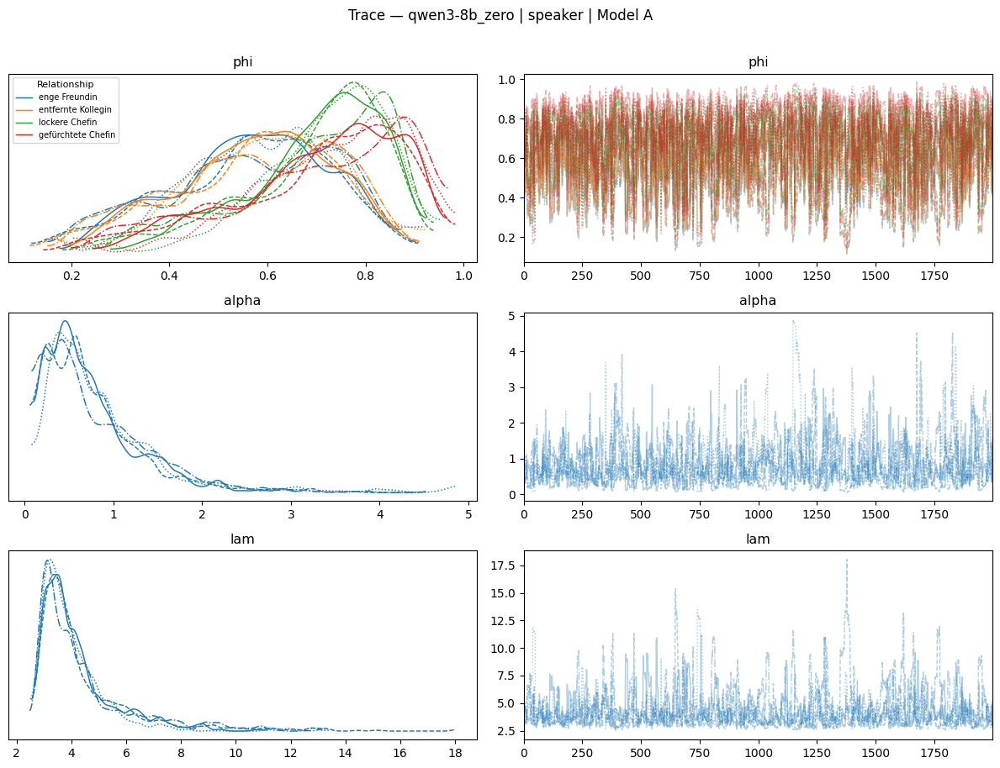

저장 → results/trace_speaker_A_qwen3-8b_zero.png


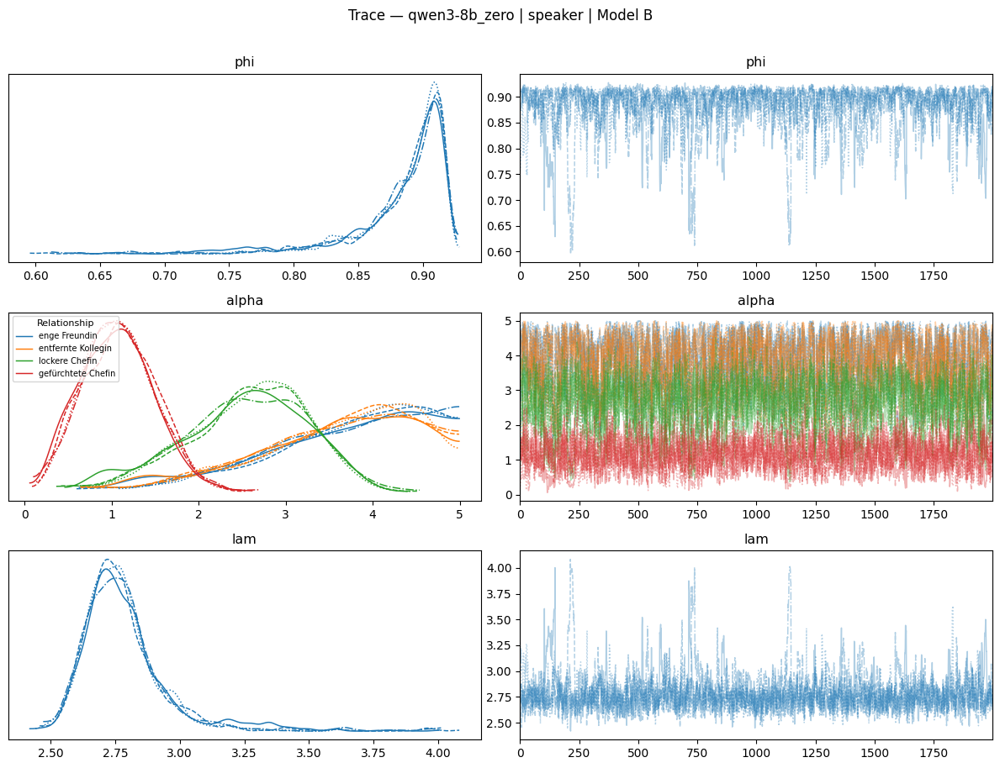

저장 → results/trace_speaker_B_qwen3-8b_zero.png


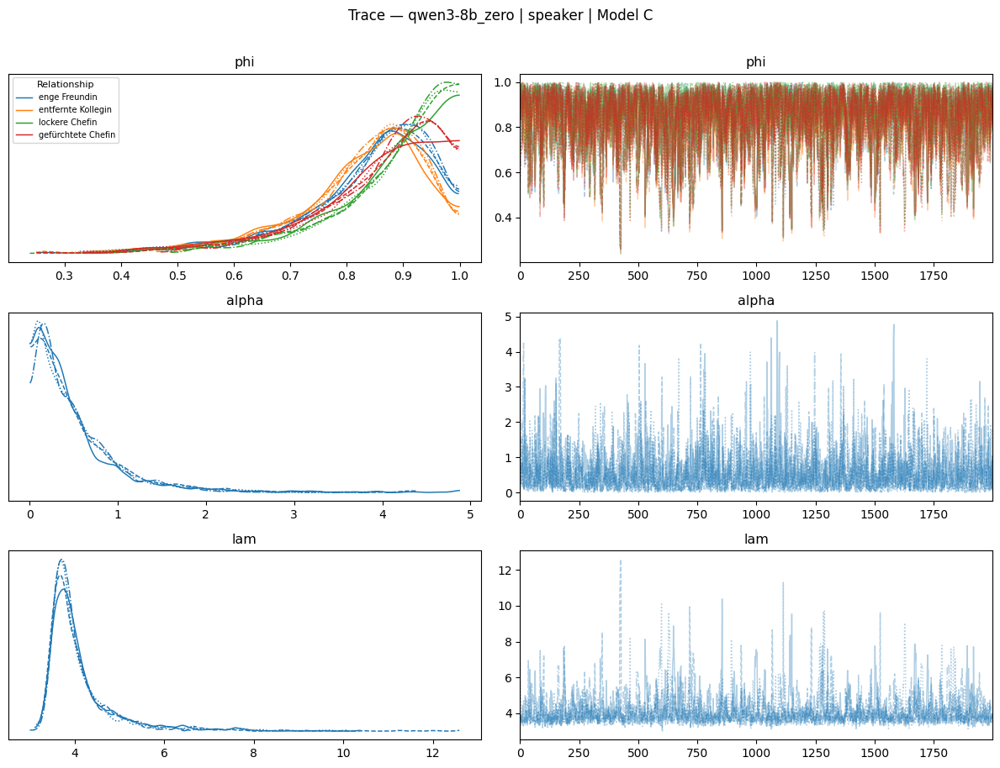

저장 → results/trace_speaker_C_qwen3-8b_zero.png


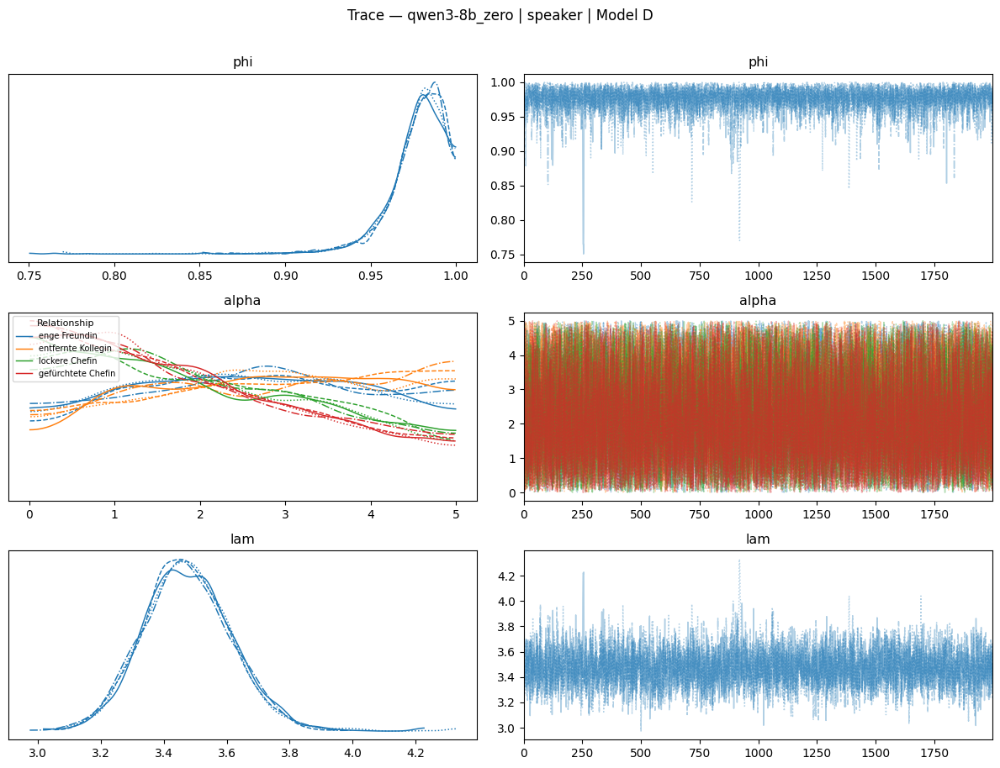

저장 → results/trace_speaker_D_qwen3-8b_zero.png


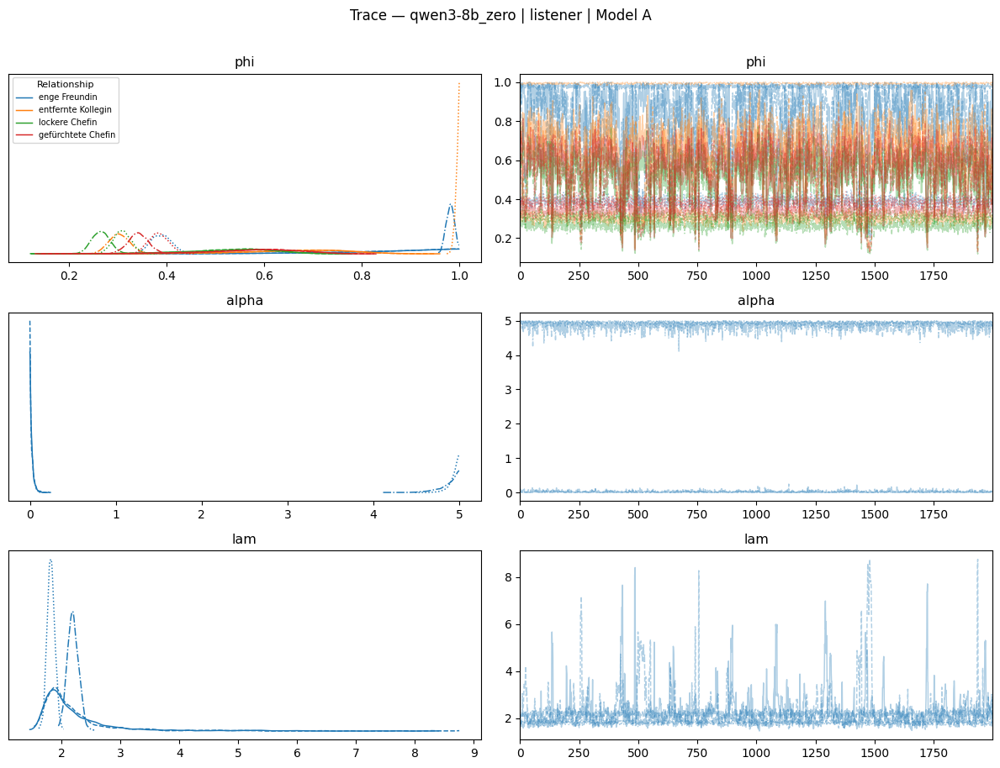

저장 → results/trace_listener_A_qwen3-8b_zero.png


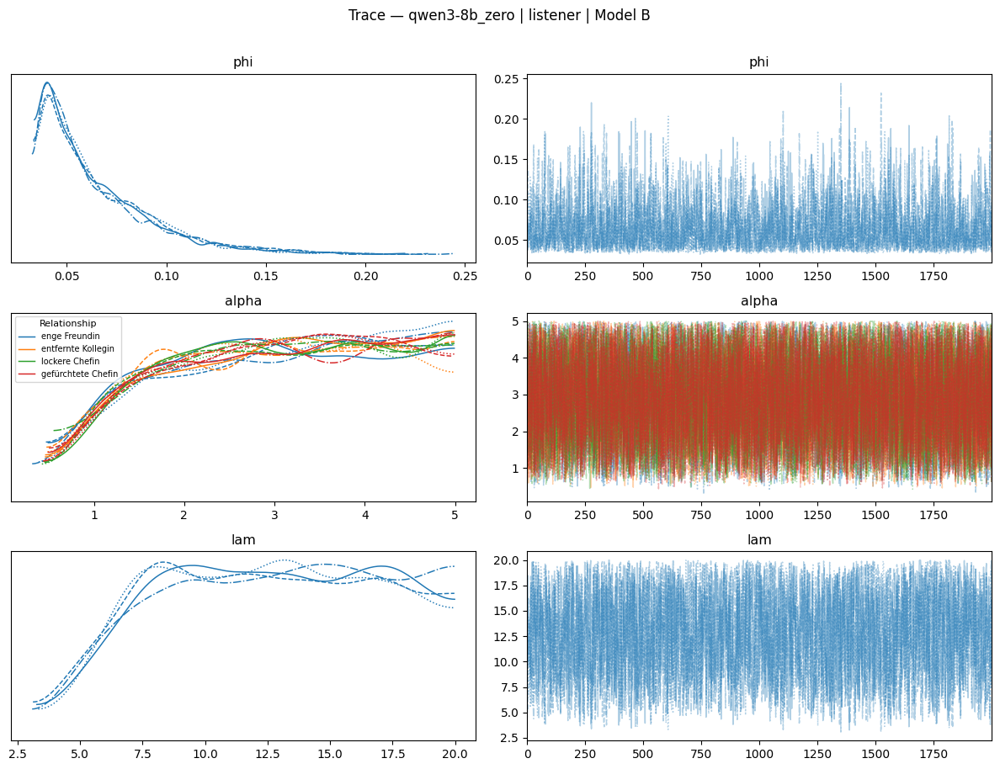

저장 → results/trace_listener_B_qwen3-8b_zero.png


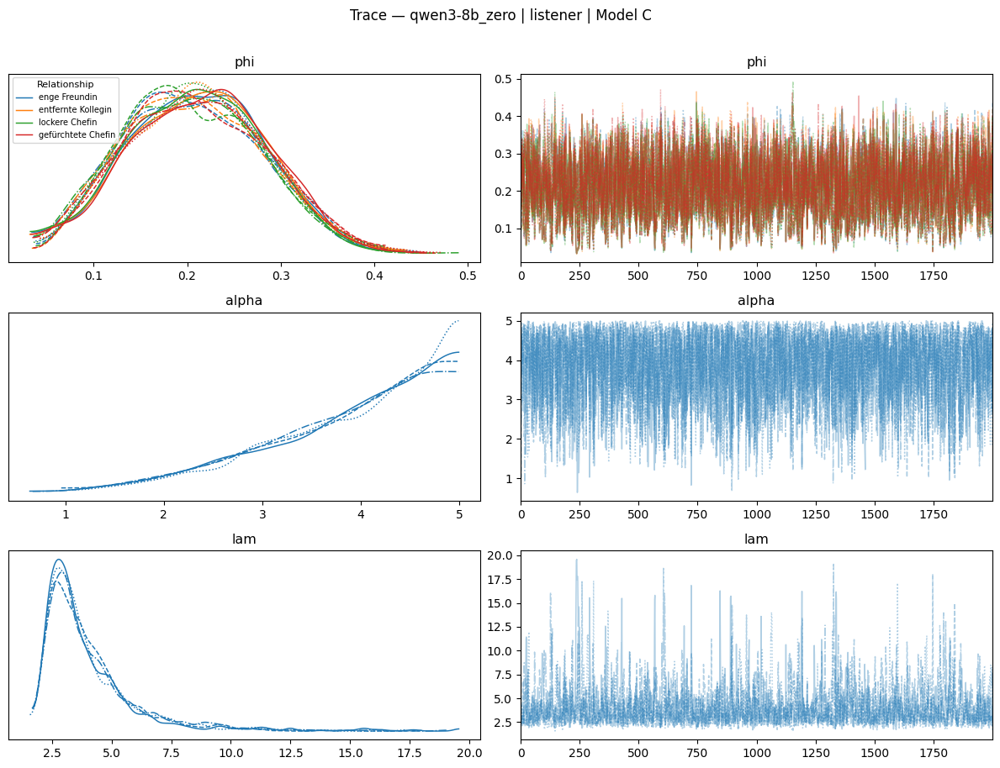

저장 → results/trace_listener_C_qwen3-8b_zero.png


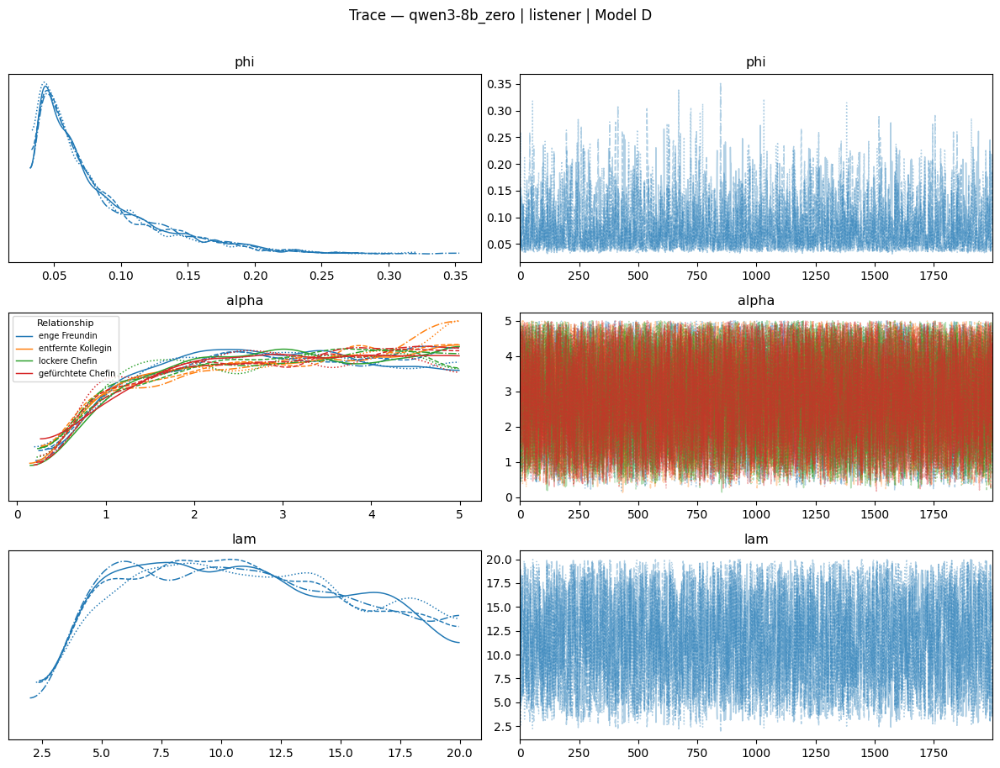

저장 → results/trace_listener_D_qwen3-8b_zero.png


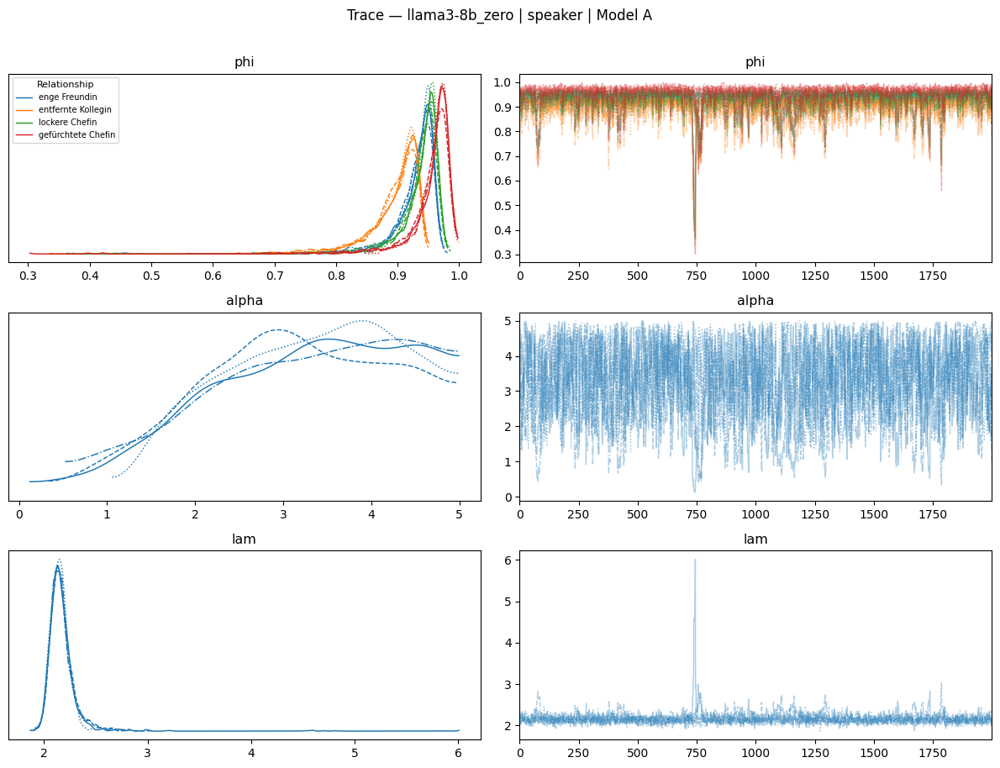

저장 → results/trace_speaker_A_llama3-8b_zero.png


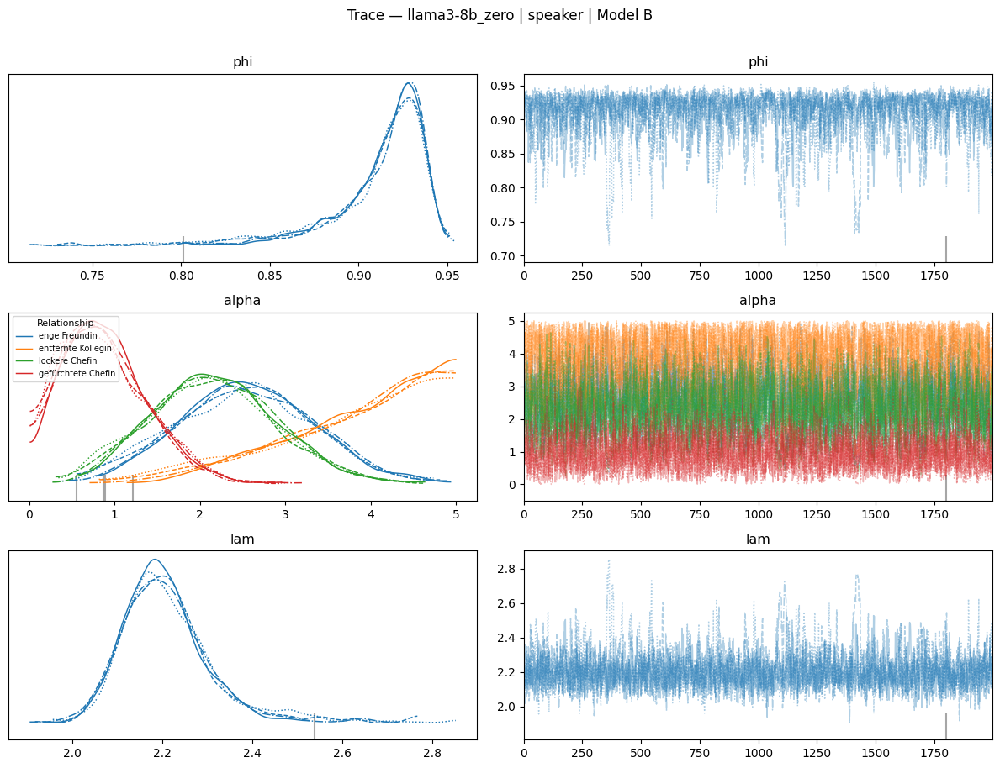

저장 → results/trace_speaker_B_llama3-8b_zero.png


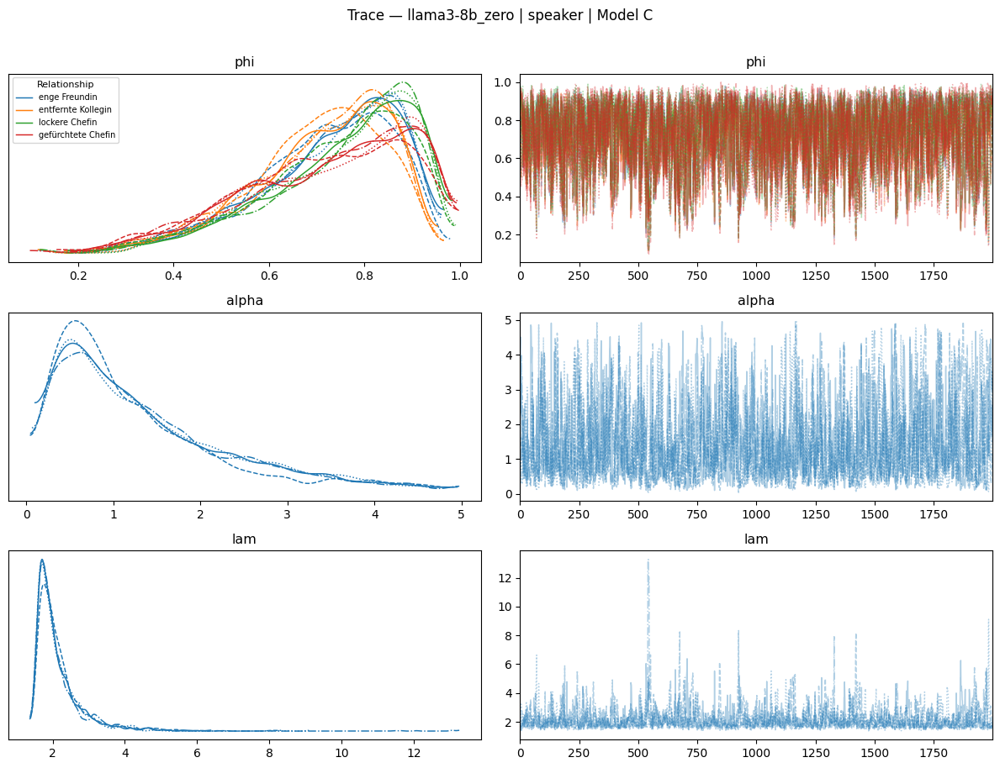

저장 → results/trace_speaker_C_llama3-8b_zero.png


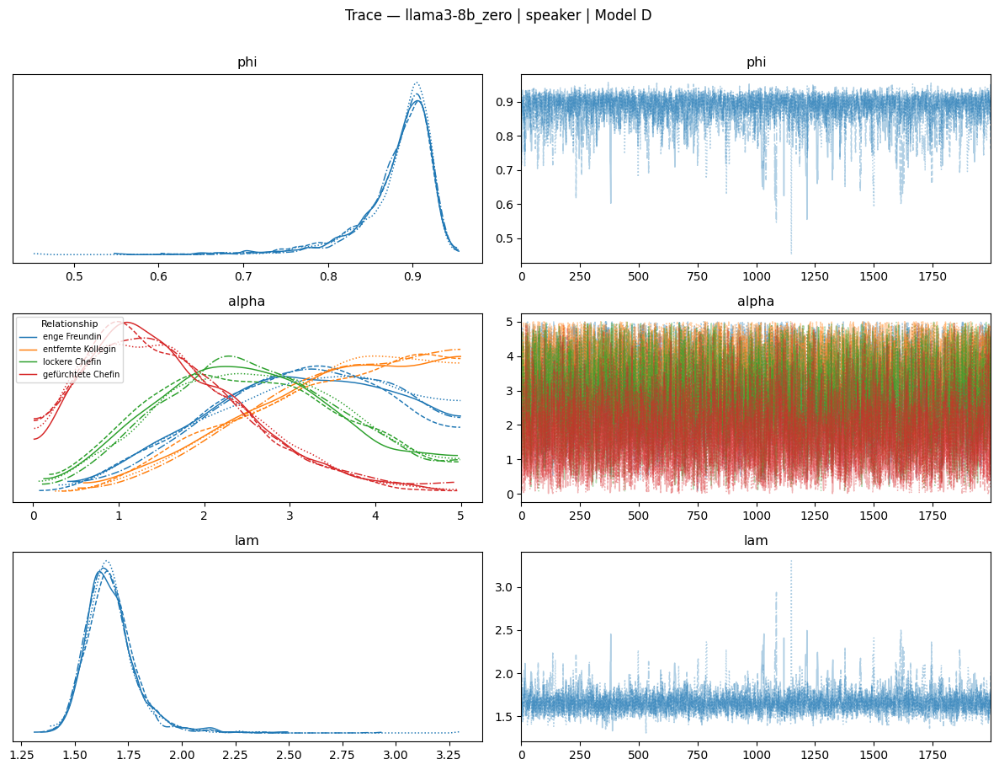

저장 → results/trace_speaker_D_llama3-8b_zero.png


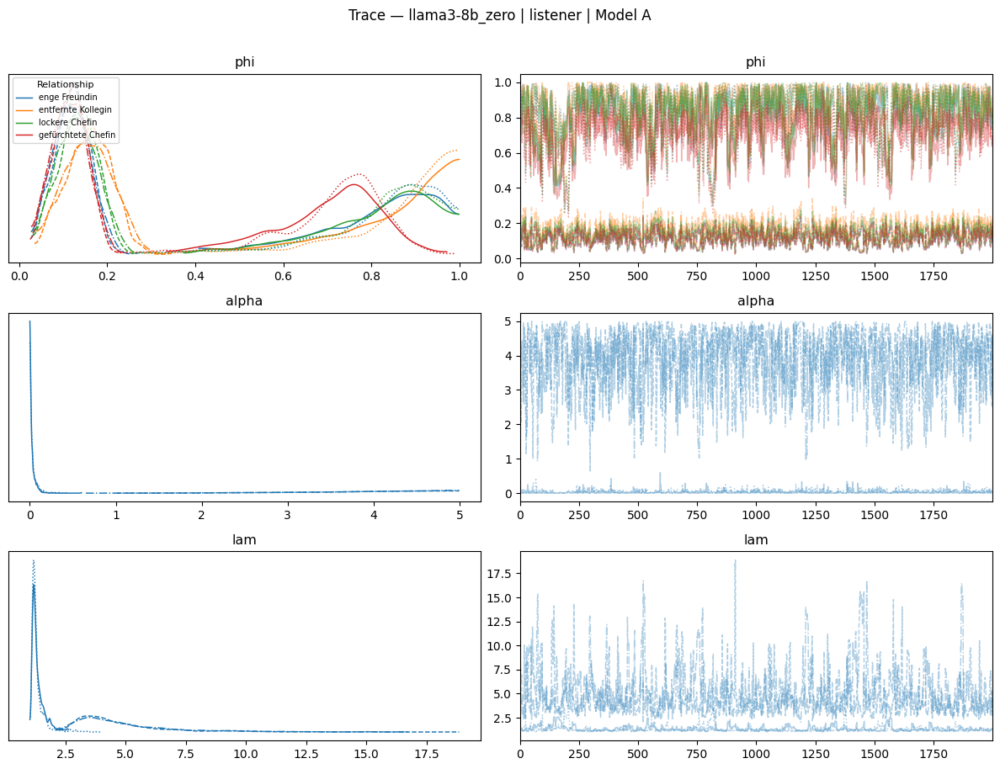

저장 → results/trace_listener_A_llama3-8b_zero.png


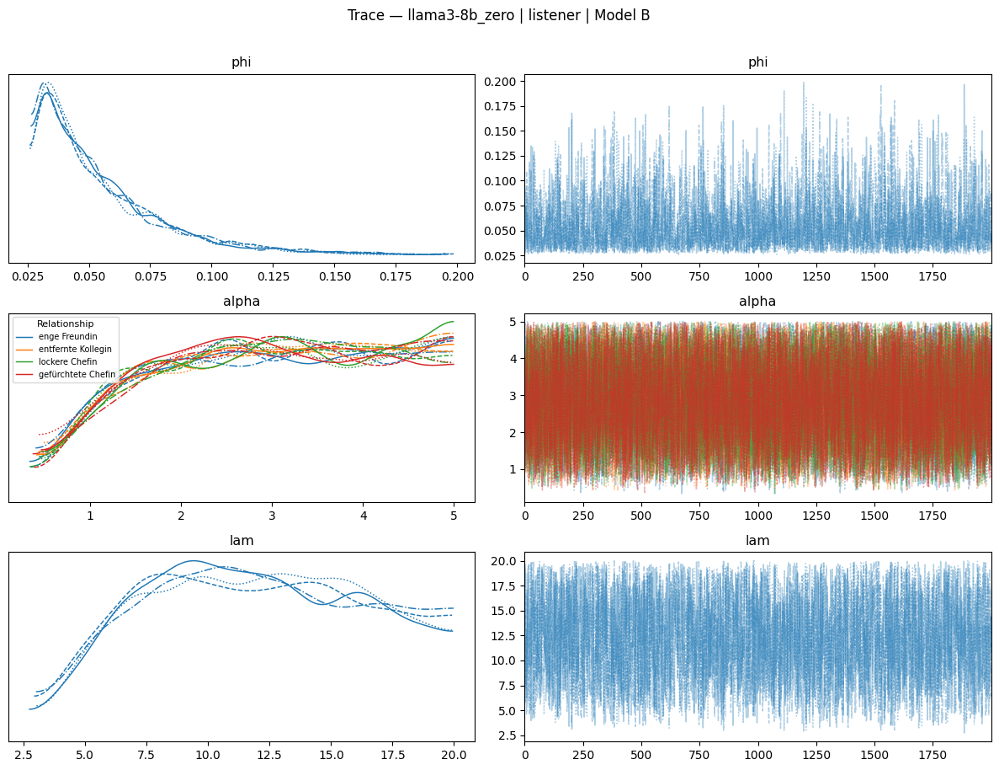

저장 → results/trace_listener_B_llama3-8b_zero.png


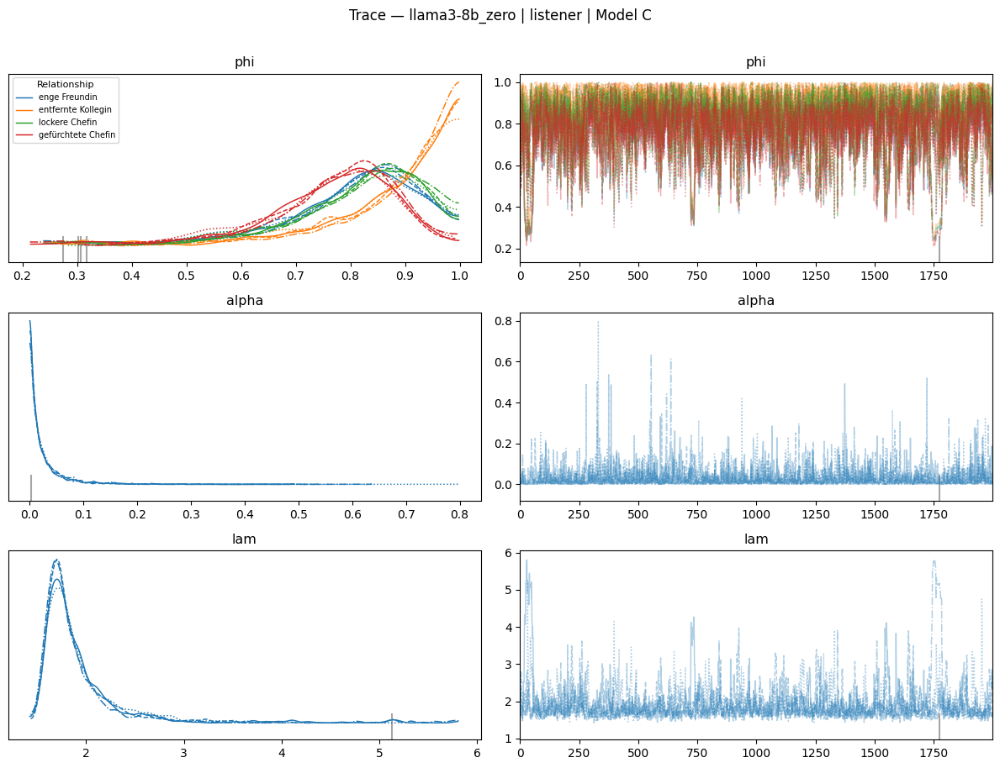

저장 → results/trace_listener_C_llama3-8b_zero.png


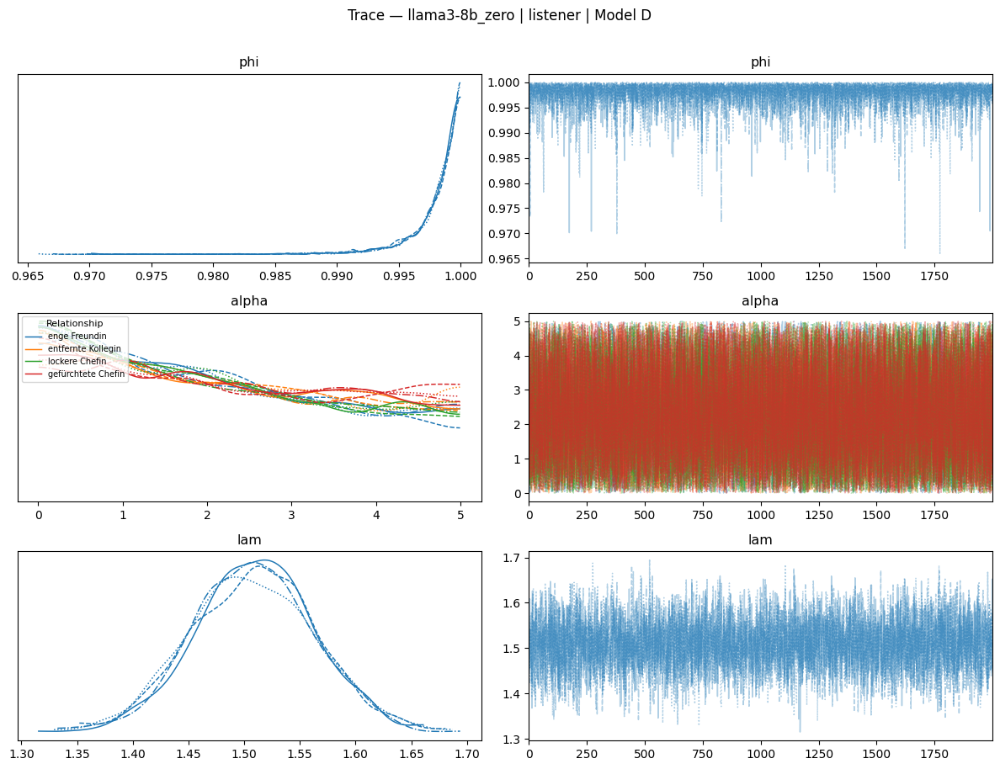

저장 → results/trace_listener_D_llama3-8b_zero.png


In [6]:
# ── Trace Plot ────────────────────────────────────────────────────────────────
TRACE_LLM   = LLM_MODELS
TRACE_ROLES = ['speaker', 'listener']
TRACE_MIDS  = ['A', 'B', 'C', 'D']

for llm in TRACE_LLM:
    for role in TRACE_ROLES:
        for mid in TRACE_MIDS:
            tr = load_trace(llm, role, mid)
            if tr is None:
                continue
            var_names = [v for v in ['phi', 'alpha', 'lam']
                         if v in tr.posterior]
            axes = az.plot_trace(tr, var_names=var_names, compact=True,
                                 figsize=(12, 3 * len(var_names)))

            # φ 또는 α는 관계별(N_rel)로 차원이 있으므로 legend 추가
            for row_axes, vname in zip(axes, var_names):
                if tr.posterior[vname].dims[-1] == f'{vname}_dim_0':
                    # KDE subplot (왼쪽)의 line들에 관계 이름 부여
                    kde_ax = row_axes[0]
                    lines = kde_ax.get_lines()
                    # compact=True → chain별 × rel별로 lines 생성되므로
                    # rel당 N_chains개 line씩 묶여 있음
                    n_chains = len(tr.posterior.chain)
                    for r_i, rel in enumerate(RELATIONS):
                        lines[r_i * n_chains].set_label(rel)
                    kde_ax.legend(fontsize=7, loc='upper left',
                                  title='Relationship', title_fontsize=8)

            plt.suptitle(f'Trace — {llm} | {role} | Model {mid}',
                         fontsize=12, y=1.01)
            plt.tight_layout()
            fname = f'results/trace_{role}_{mid}_{llm}.png'
            plt.savefig(fname, dpi=120, bbox_inches='tight')
            plt.show()
            print(f'저장 → {fname}')